<a href="https://www.kaggle.com/code/abhinayasaravanan/hospital-patient-survival-prediction-eda?scriptVersionId=114430328" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<h1><center> Hospital Patient Survival Prediction 🔦  📊 🪄 ( EDA ) using Deep Learning </center></h1>

### Contents

- Introduction
- Exploratory Data Analysis

In [1]:
# File system manangement
import time, psutil, os

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
sns.set_theme()
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


# Warning suppression
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Recording the starting time, which will be complemented with a time check at the end, to compute the total runtime of the process
start = time.time()

### 1. Introduction
Data

Source: https://journals.lww.com/ccmjournal/Citation/2019/01001/33__THE_GLOBAL_OPEN_SOURCE_SEVERITY_OF_ILLNESS.36.aspx


In [3]:
# Loading the data
data = pd.read_csv( '/kaggle/input/hospital-patientrecord/Dataset.csv' )
# Memory usage
print("Memory usage: {0:.2f} MB".format(data.memory_usage().sum()/(1024*1024)))

# Printing the dataframe
data

Memory usage: 130.15 MB


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


#### Project Motive

A patient's medical history is a major factor in determining how likely it is for him or her to survive.
The goal of this study is to forecast a patient's survival based on a variety of essential medical information. 

### Exploratory Data Analysis

    Understanding Features
    Basic Data Exploration
    Univariate Analysis
    Multivariate Analysis


## Understanding Features

In [4]:
# Loading data description
data_dictionary = pd.read_csv('/kaggle/input/hospital-patientrecord/Data Dictionary.csv')

# Memory usage
print("Memory usage: {0:.2f} MB".format(data_dictionary.memory_usage().sum()/(1024*1024)))

# Printing the dataframe
data_dictionary
     

Memory usage: 0.01 MB


,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient un...,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None
3,demographic,hospital_death,None,binary,Whether the patient died during this hospitali...,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,None
...,...,...,...,...,...,...
183,APACHE comorbidity,lymphoma,None,binary,Whether the patient has been diagnosed with no...,1
184,APACHE comorbidity,solid_tumor_with_metastasis,None,binary,Whether the patient has been diagnosed with an...,1
185,APACHE grouping,apache_3j_bodysystem,None,string,Admission diagnosis group for APACHE III,Cardiovascular
186,APACHE grouping,apache_2_bodysystem,None,string,Admission diagnosis group for APACHE II,Respiratory


## Data Exploration

In [5]:
# Shape of the data
print(pd.Series({"Shape of the dataset": data.shape}).to_string())

Shape of the dataset    (91713, 186)


In [6]:
# Count of observations
print(pd.Series({"Number of observations in the dataset": len(data)}).to_string())

Number of observations in the dataset    91713


In [7]:
# Count of columns
print(pd.Series({"Total number of columns in the dataset": len(data.columns)}).to_string())

Total number of columns in the dataset    186


In [8]:
# Column names
data.columns

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=186)

In [9]:
# Column datatypes
print(data.dtypes)

encounter_id                     int64
patient_id                       int64
hospital_id                      int64
hospital_death                   int64
age                            float64
                                ...   
leukemia                       float64
lymphoma                       float64
solid_tumor_with_metastasis    float64
apache_3j_bodysystem            object
apache_2_bodysystem             object
Length: 186, dtype: object


In [10]:
# column datatypes & it's Count
cols_int = data.columns[data.dtypes == 'int64'].tolist()
cols_float = data.columns[data.dtypes == 'float64'].tolist()
cols_object = data.columns[data.dtypes == 'object'].tolist()
print(pd.Series({"Number of integer columns": len(cols_int),
                 "Number of float columns": len(cols_float),
                 "Number of object columns": len(cols_object)}).to_string())

Number of integer columns      8
Number of float columns      170
Number of object columns       8


In [11]:
# Count of duplicate rows if any
print(pd.Series({"Number of duplicate rows in the dataset": data.duplicated().sum()}).to_string())

Number of duplicate rows in the dataset    0


In [12]:
# Count of duplicate columns if any
print(pd.Series({"Number of duplicate columns in the dataset": data.T.duplicated().sum()}).to_string())
     

Number of duplicate columns in the dataset    3


In [13]:
# Constant columns - If any column in the dataset has a constant value throughout
cols_constant = data.columns[data.nunique() == 1].tolist()
if len(cols_constant) == 0:
    cols_constant = "None"
print(pd.Series({"Constant columns in the dataset": cols_constant}).to_string())

Constant columns in the dataset    [readmission_status]


In [14]:
# Count of columns with missing values
print(pd.Series({"Number of columns with missing values in the dataset": len(data.isna().sum()[data.isna().sum() != 0])}).to_string())

Number of columns with missing values in the dataset    175


In [15]:
# Columns with missing values and respective proportions of values that are missing
print((data.isna().sum()/len(data))[data.isna().sum() != 0].sort_values(ascending = False))

h1_bilirubin_max    0.922650
h1_bilirubin_min    0.922650
h1_lactate_min      0.919924
h1_lactate_max      0.919924
h1_albumin_max      0.913982
                      ...   
d1_sysbp_max        0.001734
d1_heartrate_max    0.001581
d1_heartrate_min    0.001581
icu_admit_source    0.001221
gender              0.000273
Length: 175, dtype: float64


In [16]:
# Statistical description of numerical variables in the dataset
data.describe()     

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [17]:
# Statistical description of categorical variables in the dataset
data.describe(include = ['O'])

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
count,90318,91688,70304,91601,91713,91713,90051,90051
unique,6,2,15,5,3,8,11,10
top,Caucasian,M,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,Cardiovascular,Cardiovascular
freq,70684,49469,36962,54060,86183,50586,29999,38816


In [18]:
# Dropping constant columns
data.drop(cols_constant, axis = 1, inplace = True)
cols_int.remove('readmission_status')

##### Summary of the dataset --------------->>
- Number of observations: $91713$
- Number of columns: $186$
- Number of integer columns: $8$
- Number of float columns: $170$
- Number of object columns: $8$
- Number of duplicate observations: $0$
- Constant column: `readmission_status`
- Number of columns with missing values: $175$
- Columns with over $90\%$ missing values: `h1_bilirubin_max`, `h1_bilirubin_min`, `h1_lactate_min`, `h1_lactate_max`, `h1_albumin_max`
- Memory Usage: $130.15$ MB

## Univariate Analysis

The target variable hospital_death is a binary variable indicating the survival status of a patient.
- 0↦patient survived
- 1↦patient died

In [19]:
# Function to construct barplot and donutplot of a dataframe column
def bar_donut(df, col, height = 500, width = 800, manual_title_text = False, title_text = "Frequency distribution"):
    fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'xy'}, {'type': 'domain'}]])
    fig.add_trace(go.Bar(x = df[col].value_counts(sort = False).index.tolist(),
                         y = df[col].value_counts(sort = False).tolist(),
                         text = df[col].value_counts(sort = False).tolist(),
                         textposition = 'auto'),
                         row = 1, col = 1)
    fig.add_trace(go.Pie(values = df[col].value_counts(sort = False).tolist(),
                         labels = df[col].value_counts(sort = False).index.tolist(),
                         hole = 0.5, textinfo = 'label+percent', title = f"{col}"),
                         row = 1, col = 2)
    fig.update_layout(height = height, width = width, showlegend = False,
                      title = {'text': f"Frequency distribution of {col}",
                               'y': 0.95, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
                      xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))
    if manual_title_text == True:
        fig.update_layout(height = height, width = width, showlegend = False,
                          title = {'text': title_text,
                                   'y': 0.95, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
                          xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))
    fig.show()

In [20]:
# hospital_death
bar_donut(data, 'hospital_death')

### Predictor variables

In [21]:
# Function to compute almost constant columns and relative frequencies of corresponding modes
def almost_constant(df, threshold = 0.9, show = True, return_list = True):
    rel_freq = []
    for col in df.columns:
        mode_rel_freq = max(df[col].value_counts(sort = True)/len(df[col]))
        if mode_rel_freq > threshold:
            rel_freq.append((col, mode_rel_freq))
    keys = [item[0] for item in rel_freq]
    values = [item[1] for item in rel_freq]
    series = pd.Series(data = values, index = keys).sort_values(ascending = False)
    if show == True:
        print(series.to_string())
    if return_list == True:
        return keys

In [22]:
# Almost constant columns and relative frequencies of corresponding modes
almost_constant_cols = almost_constant(data.drop('hospital_death', axis = 1), threshold = 0.9)

aids                           0.991353
lymphoma                       0.988104
leukemia                       0.985193
hepatic_failure                0.979316
gcs_unable_apache              0.979272
cirrhosis                      0.976634
solid_tumor_with_metastasis    0.971727
immunosuppression              0.966243
arf_apache                     0.964443
icu_stay_type                  0.939703


**Observations:**
- The column `readmission_status` is same for every observation, and hence is not relevant in the context of predicting the target variable
- Apart from `readmission_status`, relative frequency of the mode value is over $0.9$ for $10$ other predictor variables, among which `icu_stay_type` is an object variable, taking values `admit`, `transfer` and `readmit`, while the rest are binary float variables, taking values `0.0` and `1.0`

In [23]:
# Donutplots in N x 3 grid form
def donuts_grid(df, cols, ncols = 3, hole = 0.5, height = 1500, width = 900):
    nrows = math.ceil(len(cols)/ncols)
    specs = np.full((nrows, ncols), {'type': 'domain'}).tolist()
    fig = make_subplots(rows = nrows, cols = ncols, specs = specs)
    count = 0
    break_flag = False
    for row in range(nrows):
        for col in range(ncols):
            i = (row * ncols) + col
            fig.add_trace(go.Pie(values = df[cols[i]].value_counts(sort = False).tolist(),
                                 labels = df[cols[i]].value_counts(sort = False).index.tolist(),
                                 hole = hole, textinfo = 'percent', title = f'{cols[i]}'),    # 'label+percent'
                          row = row + 1, col = col + 1)
            count = count + 1
            if count == len(cols):
                break_flag = True
                break
        
        if break_flag == True:
            break
    
    fig.update_layout(height = height, width = width)
    fig.show()

In [24]:
# Binary columns except gender and hospital_death
cols_binary = [col for col in data.columns if data[col].nunique() == 2]
cols_binary.remove('gender')
cols_binary.remove('hospital_death')
donuts_grid(data, cols_binary, ncols = 4, hole = 0.5, height = 1250, width = 1200)

In [25]:
# gender and icu_stay_type
fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'domain'}, {'type': 'domain'}]])
fig.add_trace(go.Pie(values = data['gender'].value_counts(sort = False).tolist(),
                     labels = data['gender'].value_counts(sort = False).index.tolist(),
                     hole = 0.5, textinfo = 'label+percent', title = 'gender'),
                     row = 1, col = 1)
fig.add_trace(go.Pie(values = data['icu_stay_type'].value_counts(sort = False).tolist(),
                     labels = data['icu_stay_type'].value_counts(sort = False).index.tolist(),
                     hole = 0.5, textinfo = 'label+percent', title = 'icu_stay_type'),
                     row = 1, col = 2)
fig.update_layout(height = 450, width = 900, showlegend = False)
fig.show()

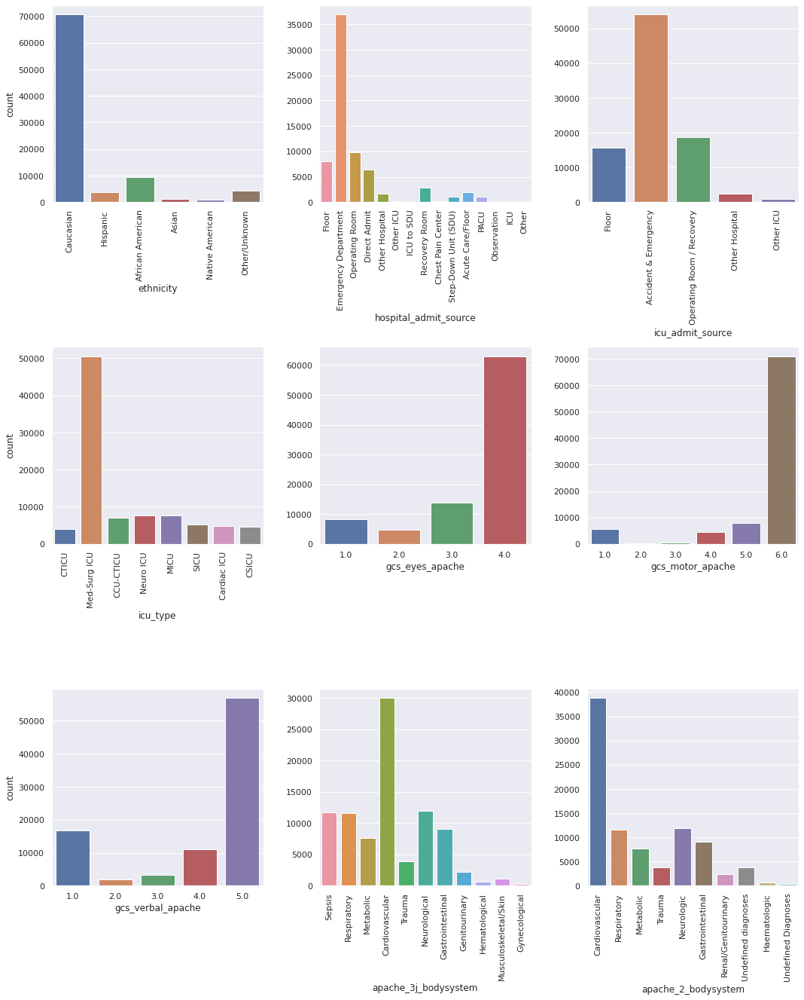

In [26]:
# Columns with 4 to 15 distinct values
cols_selected = [col for col in data.columns if 3 < data[col].nunique() <= 15]
col_vert = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']
nrows = math.ceil(len(cols_selected)/3)
fig, ax = plt.subplots(nrows, 3, figsize = (15, 6.2*nrows), sharey = False)
for i in range(len(cols_selected)):
    countplot = sns.countplot(data = data, x = cols_selected[i], ax = ax[i//3, i%3])
    if cols_selected[i] in col_vert:
        countplot.set_xticklabels(countplot.get_xticklabels(), rotation = 90)
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

In [27]:
# Non-float columns with more than 15 distinct values
[col for col in data.columns if data[col].nunique() > 15 and data[col].dtype != 'float64']

['encounter_id', 'patient_id', 'hospital_id', 'icu_id']

In [28]:
# Number of unique values
keys = ['encounter_id', 'patient_id', 'hospital_id', 'icu_id']
values = [data[col].nunique() for col in keys]
print(pd.Series(data = values, index = keys).to_string())

encounter_id    91713
patient_id      91713
hospital_id       147
icu_id            241


**Observation:** The features `encounter_id` and `patient_id` are unique for each observation, and hence do not contribute to the task of predicting the target variable.

In [29]:
# Dropping encounter_id and patient_id
data.drop(['encounter_id', 'patient_id'], axis = 1, inplace = True)
cols_int.remove('encounter_id')
cols_int.remove('patient_id')

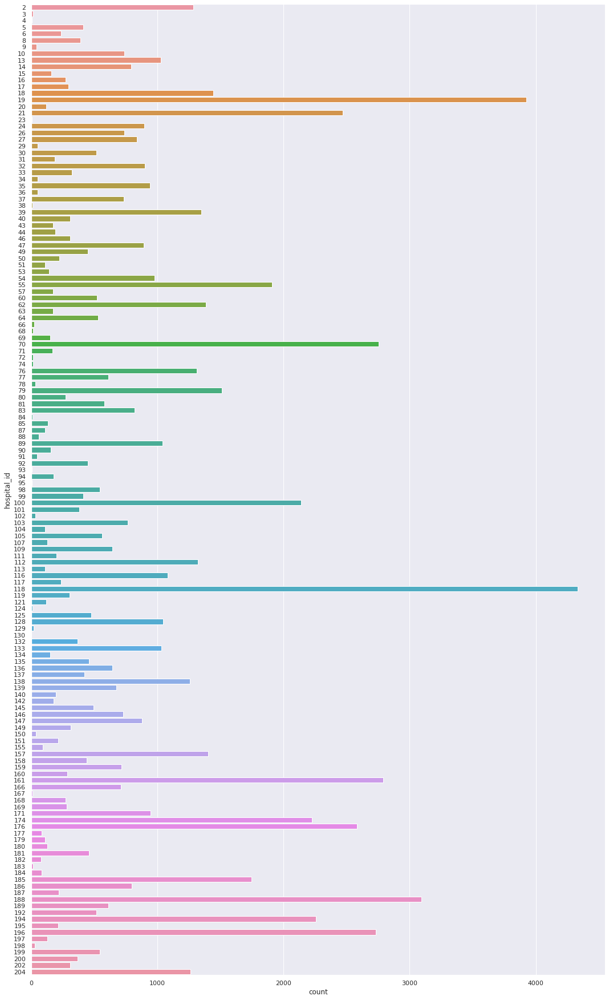

In [30]:
# hospital_id
plt.figure(figsize = (15, data['hospital_id'].nunique()/6))
sns.countplot(data = data, y = 'hospital_id')
plt.tight_layout()
plt.show()

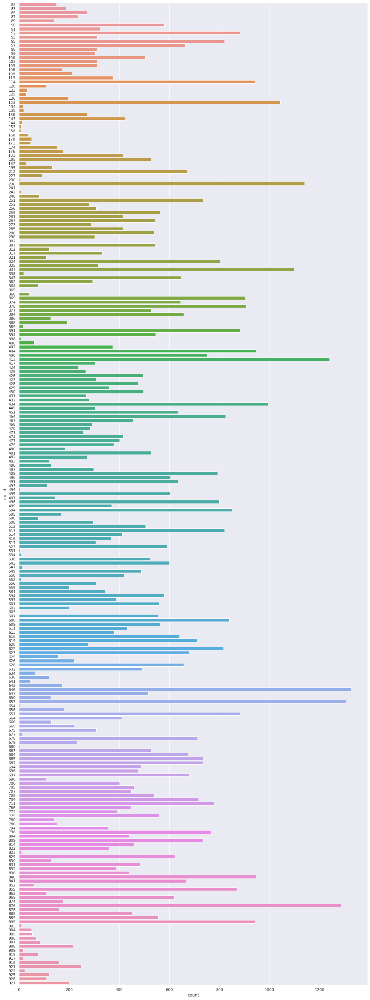

In [31]:
# icu_id
plt.figure(figsize = (15, data['icu_id'].nunique()/6))
sns.countplot(data = data, y = 'icu_id')
plt.tight_layout()
plt.show()

In [32]:
# Histograms in grid
def distribution_plot(df, cols, ncols = 4, kind = 'hist', hue = None, height = 0.84*4, width = 4):
    cols = [col for col in df.columns if df[col].nunique() > 15 and df[col].dtype == 'float64']
    bins_fd = math.floor(len(df)**(1/3))
    nrows = math.ceil(len(cols)/ncols)
    if kind == 'hist':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.histplot(data = df, x = cols[i], bins = bins_fd, hue = hue, ax = ax[i // ncols, i % ncols])
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    elif kind == 'kde':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.kdeplot(data = df, x = cols[i], hue = hue, ax = ax[i // ncols, i % ncols])
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    else:
        raise TypeError(f"'{kind}' is not a valid argument for the parameter kind. Use 'hist' or 'kde'.")
    plt.tight_layout()
    plt.show()

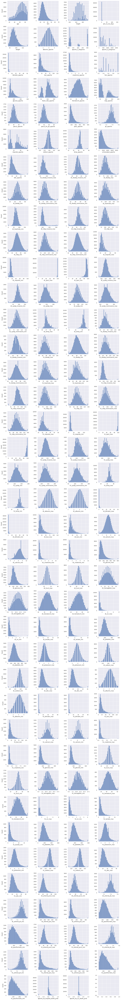

In [33]:
# Float columns with more than 15 distinct values
cols_selected = [col for col in data.columns if data[col].nunique() > 15 and data[col].dtype == 'float64']
distribution_plot(df = data, cols = cols_selected, kind = 'hist')

<a name = "Multivariate-Analysis"></a>
## 2.4. Multivariate Analysis

- Relationships among the predictor variables
- Relationships of the target variable with the predictor variables

### Relationships among the predictor variables

### Correlation structure among numerical features

In [34]:
# Heatmap
cols_selected = [col for col in cols_int + cols_float if col != 'hospital_death']
plt.figure(figsize = (180, 135))
sns.heatmap(data[cols_selected].corr(), annot = True, cmap = plt.cm.CMRmap_r)

<AxesSubplot:>

In [35]:
# Function to detect pairs with extreme correlation
def pairs_with_strong_corr(df, cols, threshold = 0.8, show = True, return_variables = False):
    variable_list = []
    corr_positive_list = []
    corr_negative_list = []
    for i in range(len(cols)):
        for j in range(len(cols)):
            if i<j:
                corr = df[cols[i]].corr(df[cols[j]])
                if corr > threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_positive_list.append(((cols[i], cols[j]), corr))
                if corr < -threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_negative_list.append(((cols[i], cols[j]), corr))
    if show == True:
        corr_positive = pd.Series(data = [item[1] for item in corr_positive_list], index = [item[0] for item in corr_positive_list])
        corr_negative = pd.Series(data = [item[1] for item in corr_negative_list], index = [item[0] for item in corr_negative_list])
        print("Pairs with extreme positive correlation:")
        print(" ")
        print(corr_positive.sort_values(ascending = False).to_string())
        print(" ")
        print("Pairs with extreme negative correlation:")
        print(" ")
        print(corr_negative.sort_values(ascending = True).to_string())
    if return_variables == True:
        return variable_list

In [36]:
# Detecting pairs with extreme correlation
cols_selected = [col for col in cols_int + cols_float if col != 'hospital_death']
pairs_with_strong_corr(df = data, cols = cols_selected, threshold = 0.9)

Pairs with extreme positive correlation:
 
(d1_inr_min, h1_inr_min)                        1.000000
(paco2_apache, paco2_for_ph_apache)             1.000000
(d1_inr_max, h1_inr_max)                        1.000000
(h1_bilirubin_max, h1_bilirubin_min)            0.999934
(h1_albumin_max, h1_albumin_min)                0.999727
(h1_bun_max, h1_bun_min)                        0.999630
(h1_creatinine_max, h1_creatinine_min)          0.999405
(h1_platelets_max, h1_platelets_min)            0.998206
(d1_diasbp_max, d1_diasbp_noninvasive_max)      0.997831
(h1_wbc_max, h1_wbc_min)                        0.997524
(d1_diasbp_min, d1_diasbp_noninvasive_min)      0.996871
(h1_mbp_min, h1_mbp_noninvasive_min)            0.996673
(bilirubin_apache, d1_bilirubin_max)            0.996568
(d1_sysbp_max, d1_sysbp_noninvasive_max)        0.996560
(h1_sysbp_max, h1_sysbp_noninvasive_max)        0.996377
(d1_sysbp_min, d1_sysbp_noninvasive_min)        0.996322
(d1_mbp_min, d1_mbp_noninvasive_min)         

**Observations:**

- There are $94$ pairs of numerical features with correlation coefficient over $0.9$
- There are no pair of numerical features with correlation coefficient below $-0.9$
- $3$ pairs of numerical features have correlation coefficient exactly equal to $1,$ i.e. there exists perfect linear relationship (with positive slope) between the variables in each of those pairs (this corresponds to the fact that there are $3$ duplicate columns in the dataset)

### Relationships of the target variable with the predictor variables

In [37]:
# Contingency tables for target variable and binary features
def contingency_binary(df, target, ncols = 3, figsize_multiplier = 2):
    cols_binary = [col for col in df.columns if df[col].nunique() == 2]
    cols_binary.remove(target)
    if len(cols_binary) == 0:
        print("The dataset does not contain a binary feature")
    else:
        nrows = math.ceil(len(cols_binary)/ncols)
        nvals = 2 # Binary variables
        figsize = (figsize_multiplier*nvals*ncols, 0.8*figsize_multiplier*nvals*nrows)
        fig, ax = plt.subplots(nrows, ncols, figsize = figsize, sharey = False)
        class_names_2 = df[target].value_counts().index.tolist()
        for i in range(len(cols_binary)):
            class_names_1 = df[cols_binary[i]].value_counts().index.tolist()
            contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
            for j in range(len(class_names_2)):
                for k in range(len(class_names_1)):
                    contingency_mat[j][k] = len([l for l in range(len(df)) if df[target][l] == class_names_2[j] and df[cols_binary[i]][l] == class_names_1[k]])
            contingency_table_df = pd.DataFrame(contingency_mat)
            hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g', ax = ax[i // ncols, i % ncols])
            hm.set_xlabel(f'{cols_binary[i]}', fontsize = 14)
            hm.set_ylabel(target, fontsize = 14)
            hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
        plt.tight_layout()
        plt.show()

In [38]:
# Contingency table for target variable and general categorical feature
def contingency_table(df, feature, target, figsize_multiplier = 2, title = False, rotate_xticklabels = 0, rotate_yticklabels = 0):
    class_names_1 = df[feature].value_counts().index.tolist()
    class_names_2 = df[target].value_counts().index.tolist()

    contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
    for i in range(len(class_names_2)):
        for j in range(len(class_names_1)):
            contingency_mat[i][j] = len([k for k in range(len(df)) if df[target][k] == class_names_2[i] and df[feature][k] == class_names_1[j]])

    contingency_table_df = pd.DataFrame(contingency_mat)
    plt.figure(figsize = (figsize_multiplier*len(class_names_1), 0.8*figsize_multiplier*len(class_names_2)))
    if title == True:
        plt.title(f"{target} x {feature}")
    hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g')
    hm.set_xlabel(f'{feature}', fontsize = 14)
    hm.set_ylabel(f'{target}', fontsize = 14)
    hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = rotate_xticklabels, ha = "right")
    hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = rotate_yticklabels, ha = "right")
    plt.grid(False)
    plt.show()

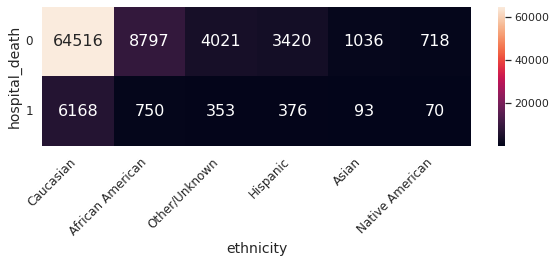

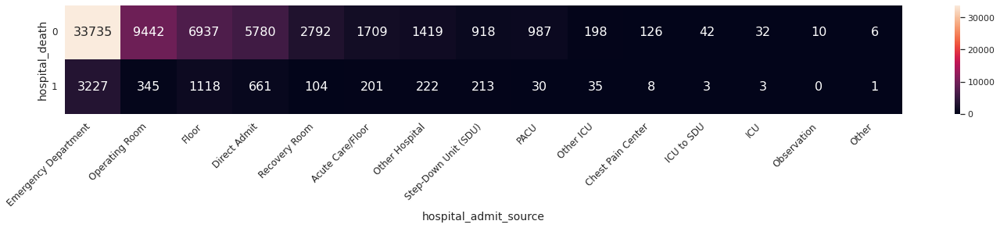

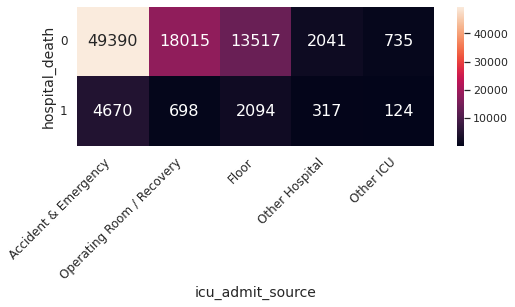

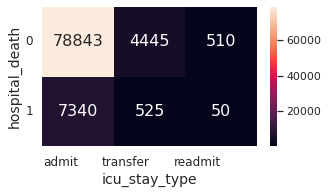

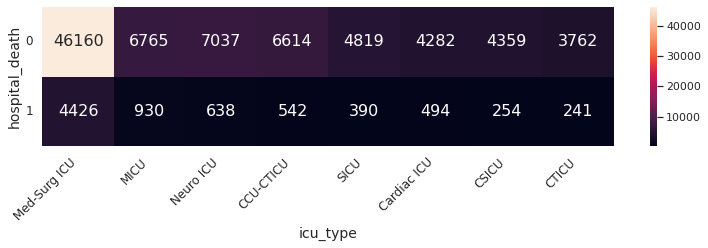

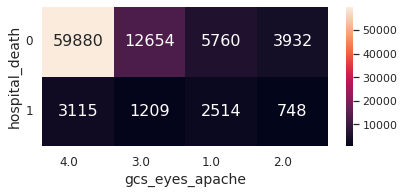

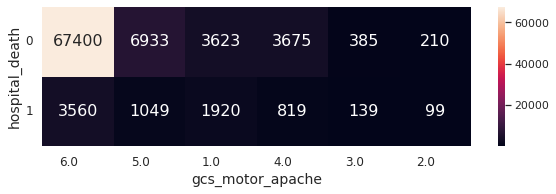

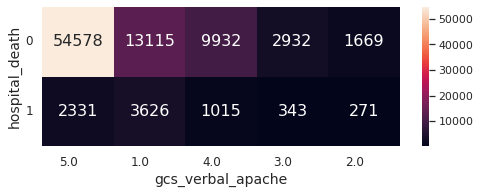

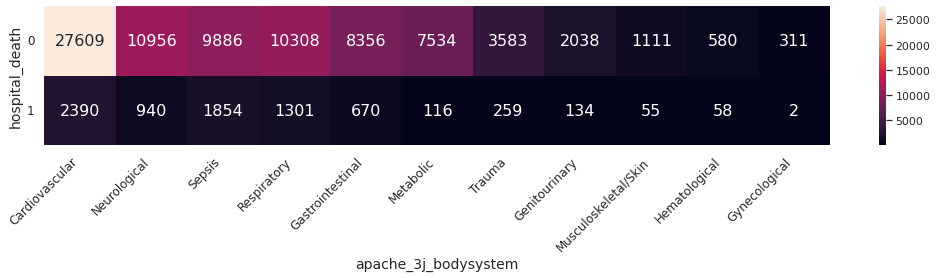

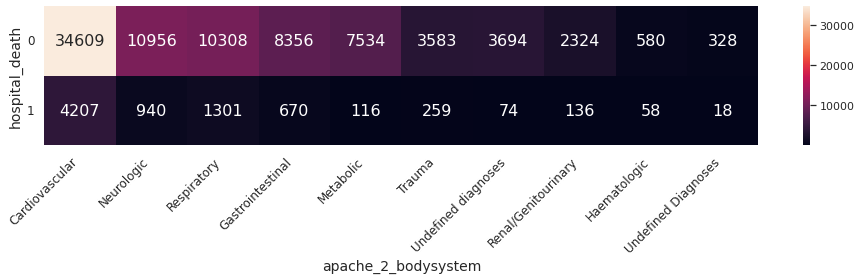

In [39]:
# Target x Features taking 3 to 15 distinct values
cols_selected = [col for col in data.columns if 3 <= data[col].nunique() <= 15]
cols_xticklabels = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']
for col in cols_selected:
    if col in cols_xticklabels:
        rotate_xticklabels = 45
    else:
        rotate_xticklabels = 0
    contingency_table(df = data, feature = col, target = 'hospital_death', figsize_multiplier = 1.6, rotate_xticklabels = rotate_xticklabels)

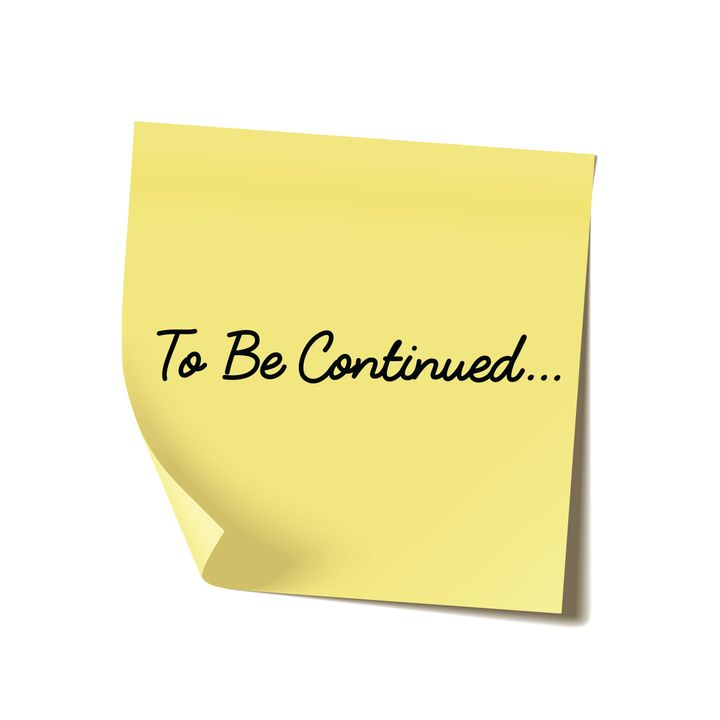